# سوال ۱

قسمت الف

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

**تابع فیلتر ایده آل بالاگذر**

In [2]:
def ideal_high_pass_filter(shape, D0):
    M, N = shape
    u = np.arange(0, M)
    v = np.arange(0, N)
    U, V = np.meshgrid(v - N//2, u - M//2)
    D = np.sqrt(U**2 + V**2)
    H = np.zeros((M, N))
    H[D > D0] = 1
    return H


**تابع myfilter**

In [3]:
def myfilter(im, D0):
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    gray = gray.astype(np.float32)

    # Fourier transform
    dft = np.fft.fft2(gray)
    dft_shift = np.fft.fftshift(dft)

    # Apply ideal HPF
    H = ideal_high_pass_filter(gray.shape, D0)
    filtered = dft_shift * H

    # Inverse FFT
    idft_shift = np.fft.ifftshift(filtered)
    img_back = np.fft.ifft2(idft_shift)
    img_back = np.abs(img_back)

    # Sharpened image: original + high-pass result
    sharpened = cv2.normalize(gray + img_back, None, 0, 255, cv2.NORM_MINMAX)
    sharpened = sharpened.astype(np.uint8)

    return gray.astype(np.uint8), sharpened, img_back


In [4]:
# بارگذاری تصویر
img = cv2.imread('/content/photo18246719707.jpg')


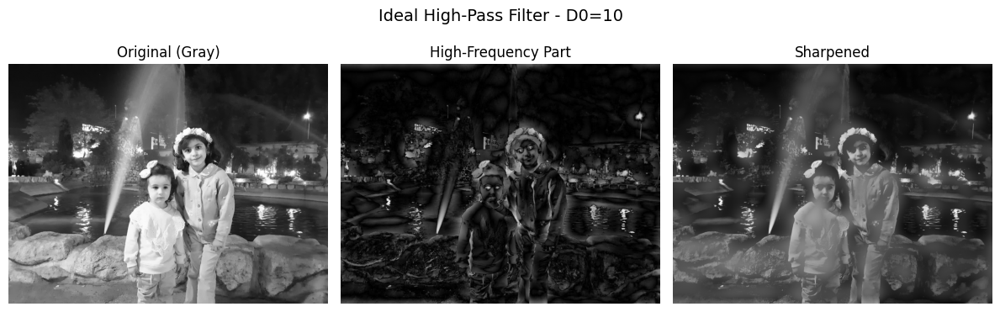

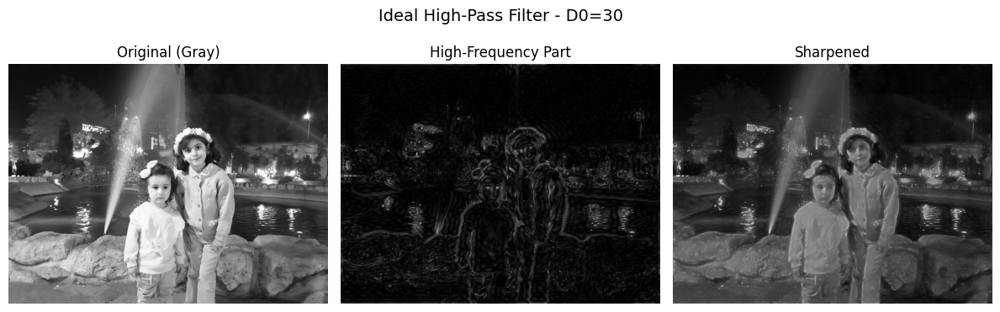

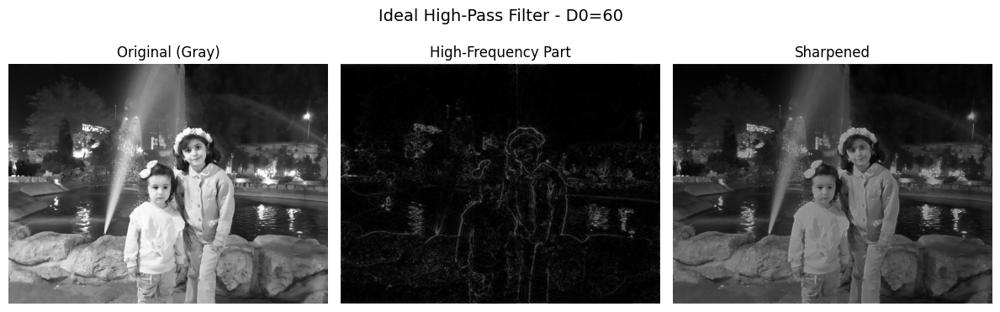

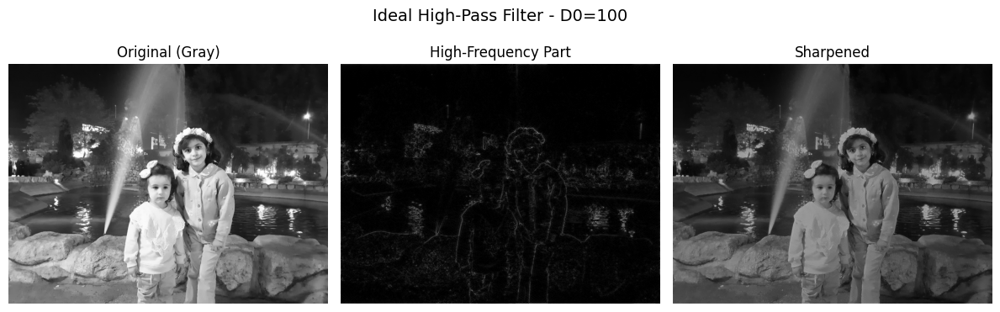

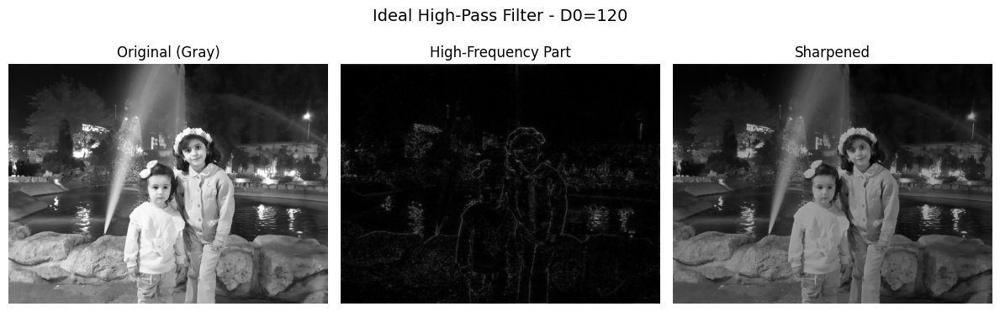

In [6]:
# اجرای فیلتر برای مقادیر مختلف D0
for D0 in [10, 30, 60, 100, 120]:
    original, sharpened, filtered = myfilter(img, D0)
    plt.figure(figsize=(12, 4))
    plt.suptitle(f'Ideal High-Pass Filter - D0={D0}', fontsize=14)

    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original (Gray)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(filtered, cmap='gray')
    plt.title('High-Frequency Part')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(sharpened, cmap='gray')
    plt.title('Sharpened')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

قسمت ب

In [7]:
def butterworth_high_pass_filter(shape, D0, n):
    M, N = shape
    u = np.arange(0, M)
    v = np.arange(0, N)
    U, V = np.meshgrid(v - N//2, u - M//2)
    D = np.sqrt(U**2 + V**2)
    H = 1 / (1 + (D0 / (D + 1e-5))**(2 * n))  # 1e-5 برای جلوگیری از تقسیم بر صفر
    return H

In [8]:
def butterworth_filter(im, D0, n=1):
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    gray = gray.astype(np.float32)

    dft = np.fft.fft2(gray)
    dft_shift = np.fft.fftshift(dft)

    H = butterworth_high_pass_filter(gray.shape, D0, n)
    filtered = dft_shift * H

    idft_shift = np.fft.ifftshift(filtered)
    img_back = np.fft.ifft2(idft_shift)
    img_back = np.abs(img_back)

    sharpened = cv2.normalize(gray + img_back, None, 0, 255, cv2.NORM_MINMAX)
    sharpened = sharpened.astype(np.uint8)

    return gray.astype(np.uint8), sharpened, img_back

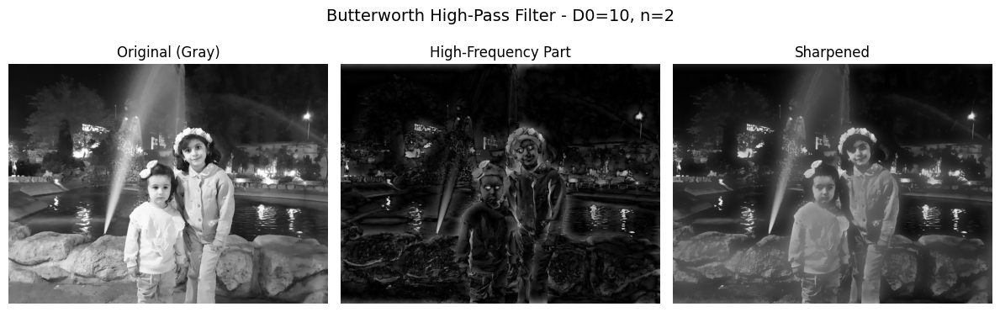

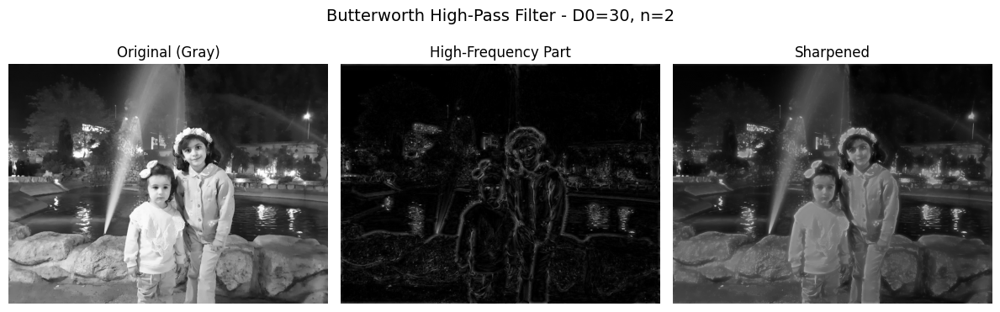

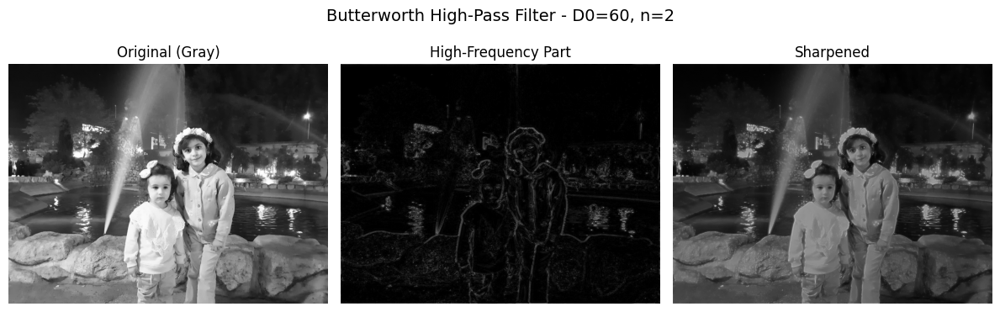

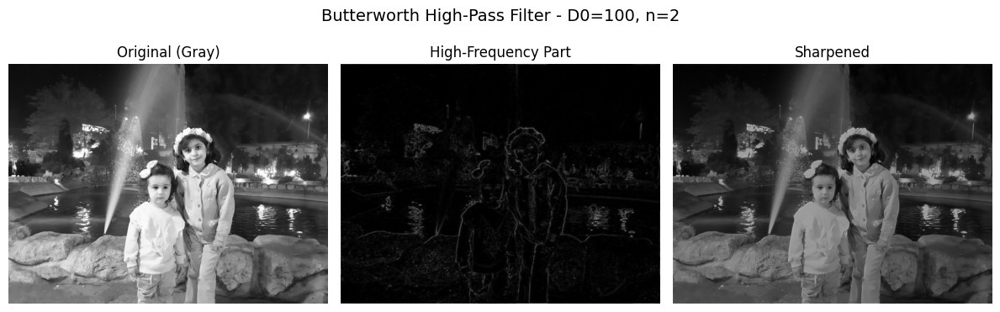

In [10]:
for D0 in [10, 30, 60, 100]:
    original, sharpened, filtered = butterworth_filter(img, D0, n=2)
    plt.figure(figsize=(12, 4))
    plt.suptitle(f'Butterworth High-Pass Filter - D0={D0}, n=2', fontsize=14)

    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original (Gray)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(filtered, cmap='gray')
    plt.title('High-Frequency Part')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(sharpened, cmap='gray')
    plt.title('Sharpened')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# سوال ۲

قسمت الف

تابع فیلتر میانه

In [11]:
def apply_median_filter(im, kernel_size):
    return cv2.medianBlur(im, kernel_size)

تابع فیلتر میانه تطبیقی

In [19]:
def adaptive_median_filter(im, max_window_size=7):
    img = im.copy()
    rows, cols = img.shape
    for i in range(rows):
        for j in range(cols):
            window_size = 5
            while window_size <= max_window_size:
                half_window = window_size // 2
                x_start = max(i - half_window, 0)
                x_end = min(i + half_window + 1, rows)
                y_start = max(j - half_window, 0)
                y_end = min(j + half_window + 1, cols)

                window = img[x_start:x_end, y_start:y_end]
                median_val = np.median(window)

                if median_val != img[i, j]:
                    img[i, j] = median_val
                    break
                window_size += 2  # افزایش اندازه پنجره تا max_window_size

    return img

بارگذاری تصاویر

In [13]:
# بارگذاری تصویر ۱
img_1 = cv2.imread('/content/Screenshot from 2025-05-17 09-46-45.png')
gray_img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)

# بارگذاری تصویر ۲
img_2 = cv2.imread('/content/Screenshot from 2025-05-17 09-46-58.png')
gray_img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)

gray_imgs = [gray_img_1, gray_img_2]

قسمت الف


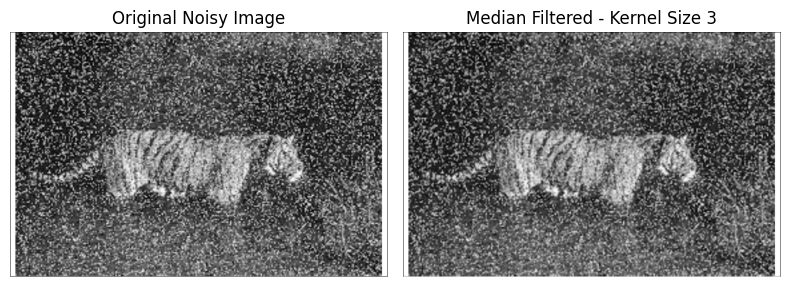

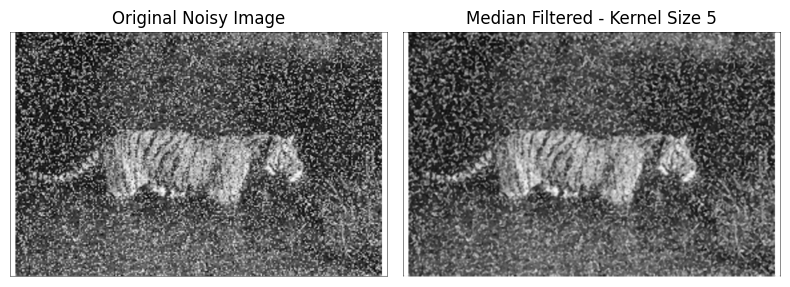

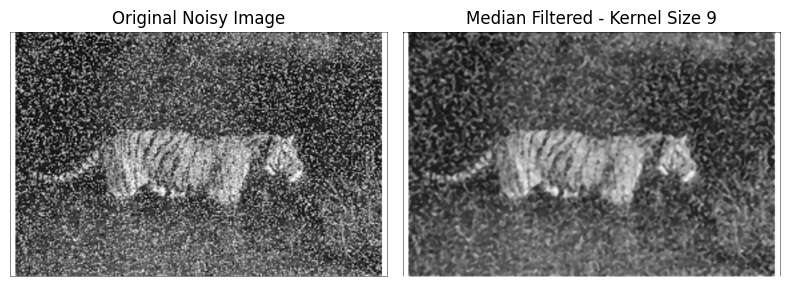

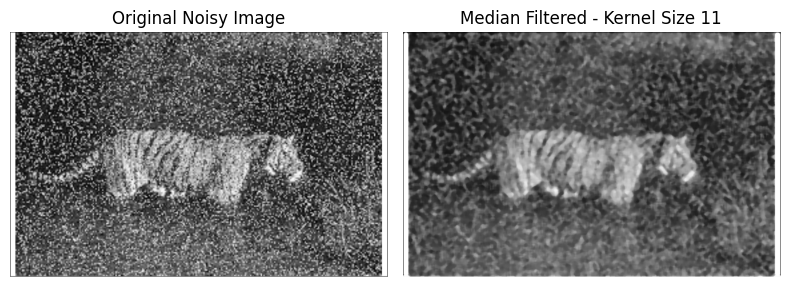

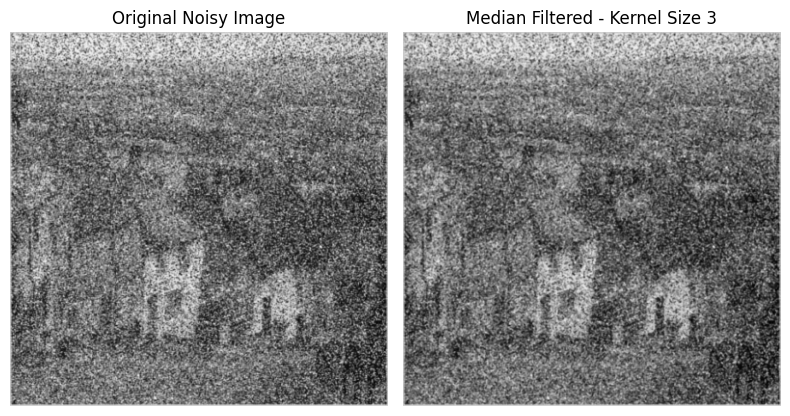

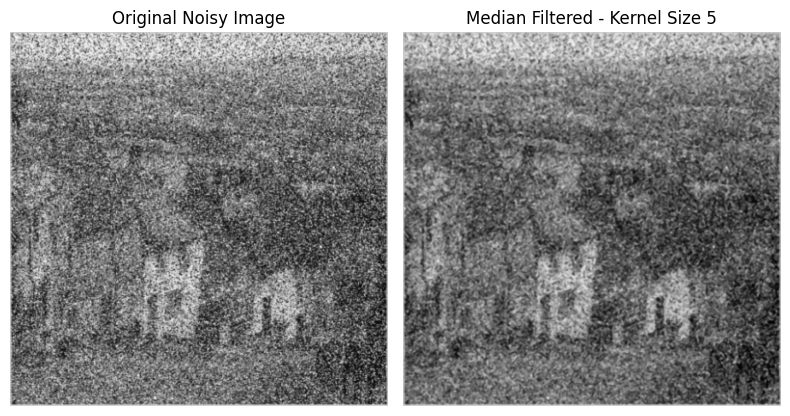

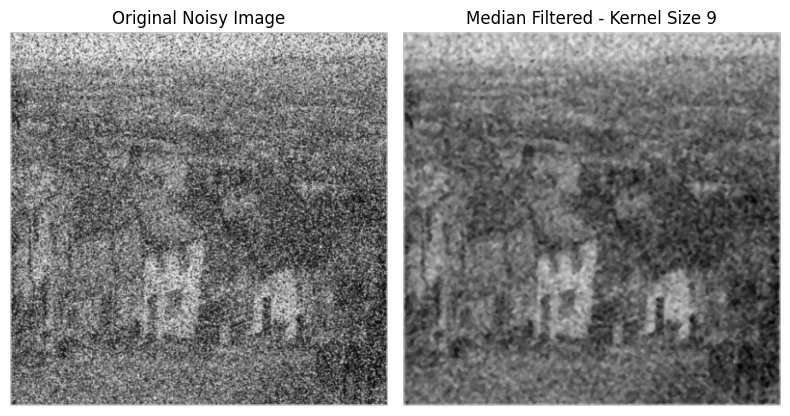

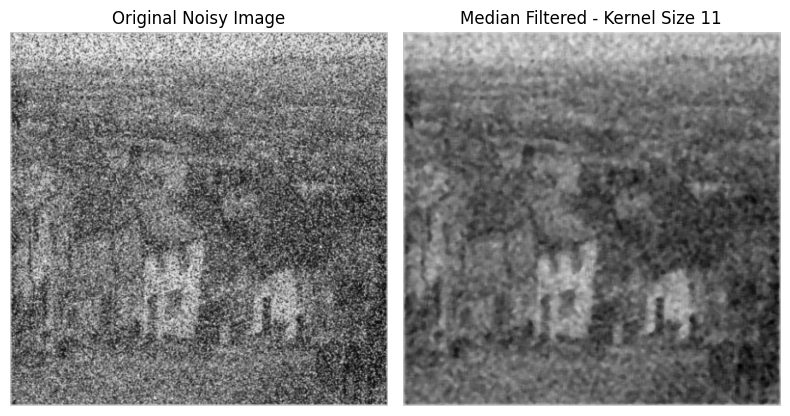

In [14]:
# اعمال فیلتر میانه با اندازه‌های مختلف
for gray_img in gray_imgs:
  kernel_sizes = [3, 5, 9, 11]
  for kernel_size in kernel_sizes:
      filtered_img = apply_median_filter(gray_img, kernel_size)
      plt.figure(figsize=(8, 8))
      plt.subplot(1, 2, 1)
      plt.imshow(gray_img, cmap='gray')
      plt.title('Original Noisy Image')
      plt.axis('off')

      plt.subplot(1, 2, 2)
      plt.imshow(filtered_img, cmap='gray')
      plt.title(f'Median Filtered - Kernel Size {kernel_size}')
      plt.axis('off')

      plt.tight_layout()
      plt.show()


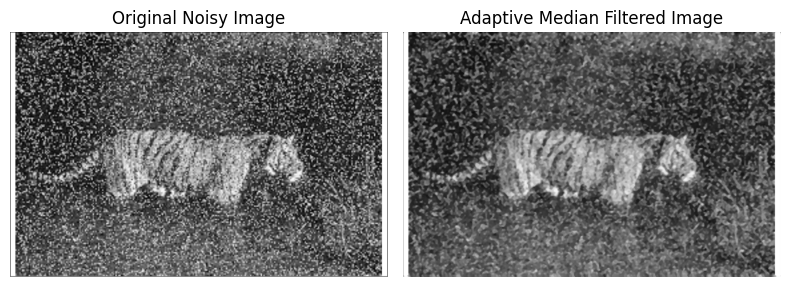

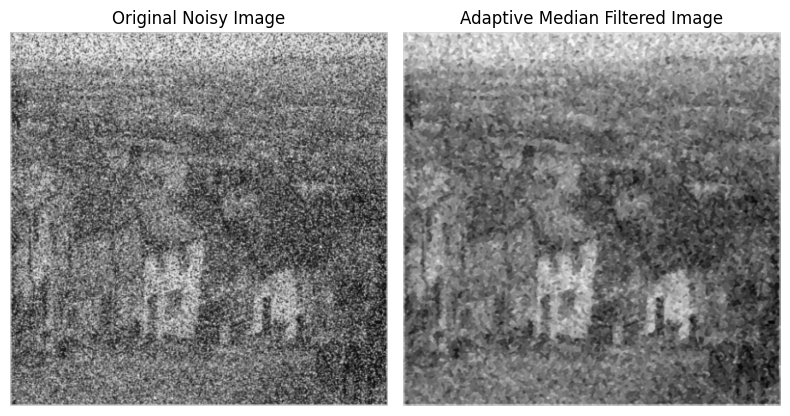

In [20]:
# اعمال فیلتر میانه تطبیقی
for gray_img in gray_imgs:
  adaptive_filtered_img = adaptive_median_filter(gray_img)
  plt.figure(figsize=(8, 8))
  plt.subplot(1, 2, 1)
  plt.imshow(gray_img, cmap='gray')
  plt.title('Original Noisy Image')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(adaptive_filtered_img, cmap='gray')
  plt.title('Adaptive Median Filtered Image')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

# سوال ۳


In [21]:
def homomorphic_filter(im, gammaH=2.0, gammaL=0.5, D0=30, c=1.0):
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY).astype(np.float32)
    gray_log = np.log1p(gray)  # log(1 + I)

    # Fourier transform
    dft = np.fft.fft2(gray_log)
    dft_shift = np.fft.fftshift(dft)

    # Create Homomorphic filter mask
    M, N = gray.shape
    u = np.arange(0, M)
    v = np.arange(0, N)
    V, U = np.meshgrid(v - N//2, u - M//2)
    D = np.sqrt(U**2 + V**2)
    H = (gammaH - gammaL) * (1 - np.exp(-c * (D**2 / (D0**2)))) + gammaL

    # Apply filter and inverse transform
    filtered_dft = dft_shift * H
    idft_shift = np.fft.ifftshift(filtered_dft)
    img_back = np.fft.ifft2(idft_shift)
    img_exp = np.expm1(np.real(img_back))  # exp(output) - 1
    img_norm = cv2.normalize(img_exp, None, 0, 255, cv2.NORM_MINMAX)
    return img_norm.astype(np.uint8)


تصویر اول

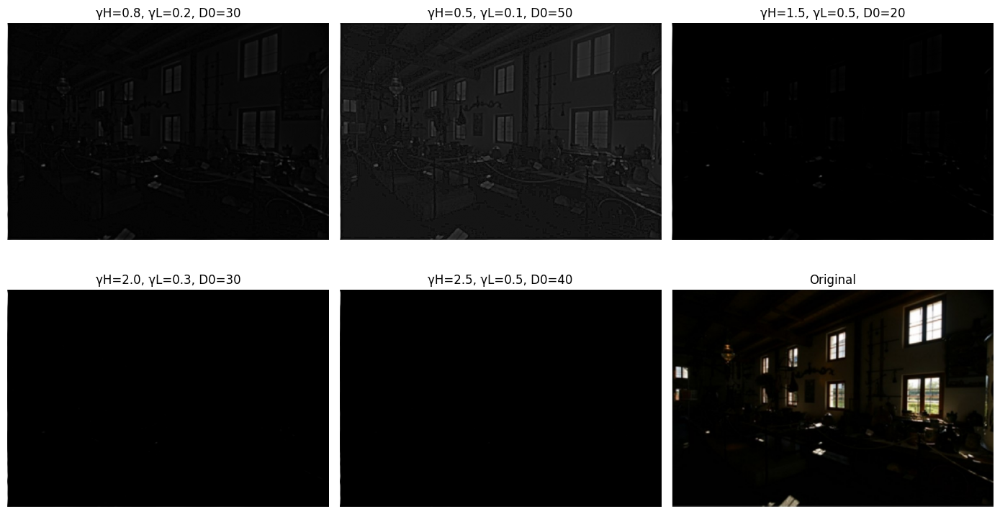

In [33]:
# بارگذاری تصویر ۱
img_1 = cv2.imread('/content/Screenshot from 2025-05-17 10-47-46.png')
gray_img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)

params = [
    (0.8, 0.2, 30),
    (0.5, 0.1, 50),
    (1.5, 0.5, 20),
    (2.0, 0.3, 30),
    (2.5, 0.5, 40),
    (2.0, 0.8, 50)
]

plt.figure(figsize=(14, 8))
for i, (gH, gL, D0) in enumerate(params):
    result = homomorphic_filter(img_1, gammaH=gH, gammaL=gL, D0=D0)
    plt.subplot(2, 3, i+1)
    plt.imshow(result, cmap='gray')
    plt.title(f'γH={gH}, γL={gL}, D0={D0}')
    plt.axis('off')

# نمایش تصویر اصلی
plt.subplot(2, 3, 6)
plt.imshow(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.tight_layout()
plt.show()

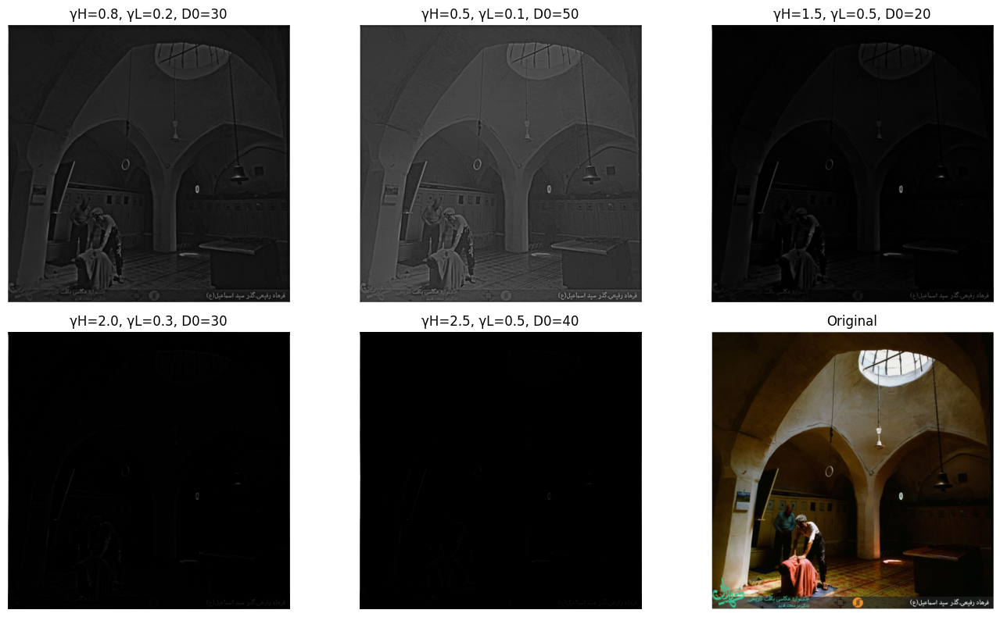

In [34]:
# بارگذاری تصویر ۱
img_2 = cv2.imread('/content/Screenshot from 2025-05-17 10-47-59.png')

params = [
    (0.8, 0.2, 30),
    (0.5, 0.1, 50),
    (1.5, 0.5, 20),
    (2.0, 0.3, 30),
    (2.5, 0.5, 40),
    (2.0, 0.8, 50)
]

plt.figure(figsize=(14, 8))
for i, (gH, gL, D0) in enumerate(params):
    result = homomorphic_filter(img_2, gammaH=gH, gammaL=gL, D0=D0)
    plt.subplot(2, 3, i+1)
    plt.imshow(result, cmap='gray')
    plt.title(f'γH={gH}, γL={gL}, D0={D0}')
    plt.axis('off')

# نمایش تصویر اصلی
plt.subplot(2, 3, 6)
plt.imshow(cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.tight_layout()
plt.show()

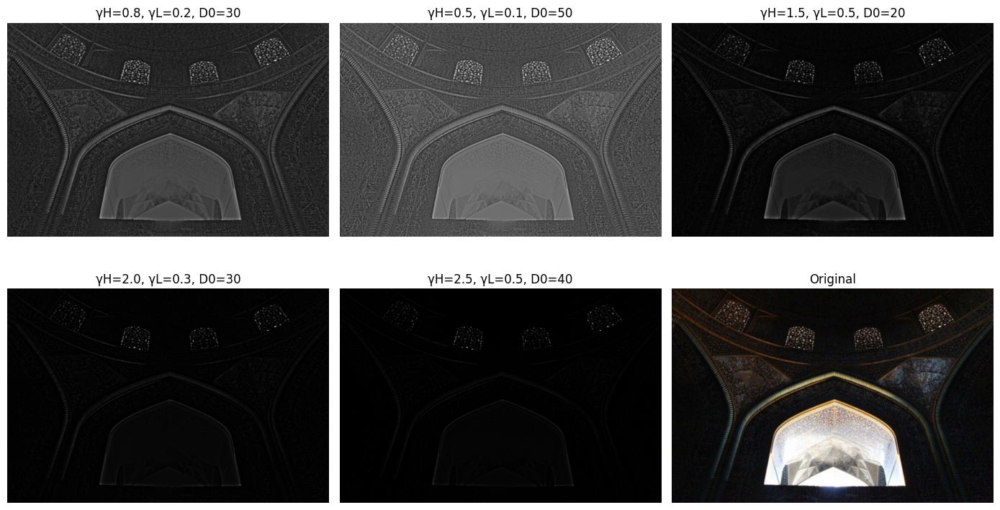

In [35]:
# بارگذاری تصویر ۱
img_3 = cv2.imread('/content/Screenshot from 2025-05-17 10-48-11.png')

params = [
    (0.8, 0.2, 30),
    (0.5, 0.1, 50),
    (1.5, 0.5, 20),
    (2.0, 0.3, 30),
    (2.5, 0.5, 40),
    (2.0, 0.8, 50)
]

plt.figure(figsize=(14, 8))
for i, (gH, gL, D0) in enumerate(params):
    result = homomorphic_filter(img_3, gammaH=gH, gammaL=gL, D0=D0)
    plt.subplot(2, 3, i+1)
    plt.imshow(result, cmap='gray')
    plt.title(f'γH={gH}, γL={gL}, D0={D0}')
    plt.axis('off')

# نمایش تصویر اصلی
plt.subplot(2, 3, 6)
plt.imshow(cv2.cvtColor(img_3, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.tight_layout()
plt.show()